# Iterative Testing & Debugging Log
**Project Title**: UrbanBrush — Neural Style Transfer for Cityscapes  
**Notebook Purpose**: To document the systematic testing and debugging process that shaped the final implementation.

## Objectives
- Identify issues in early NST experiments (e.g., shape mismatches, long runtime)
- Log parameter tuning (alpha, beta, learning rate, epochs)
- Monitor performance (runtime, memory, GPU use)
- Record *why* each fix was applied and what it achieved
- Reflect on the **design decisions** made through testing

## Motivation

Testing is central to any deep learning workflow — especially in Neural Style Transfer (NST), where tensor mismatches, long runtimes, and hyperparameter tuning are common. This notebook documents:
- What was tested
- Why errors occurred
- How they were fixed
- Justifications for final design choices

## Test Setup

All tests were run using the following:
- Machine: Windows 11, NVIDIA GeForce RTX 3050 GPU
- Environment: `nst_env`
- Frameworks: TensorFlow 2.16.1, OpenCV 4.12.0, Matplotlib 3.10.3

Both content and style images were initially resized to `(512, 512)` for fast iterations before finalizing a robust pipeline.


In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.applications import vgg19
from tensorflow.keras.models import Model
from PIL import Image

In [7]:
# Convert tensor back to PIL image
def tensor_to_image(tensor):
    tensor = tensor * 255
    tensor = np.clip(tensor, 0, 255)
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor) > 3:
        tensor = tensor[0]
    return Image.fromarray(tensor)

# Load and process image to fit VGG
def load_and_process_img(img_path, target_shape=(512, 512)):
    img = Image.open(img_path).convert('RGB')
    img = img.resize(target_shape)
    img = tf.keras.preprocessing.image.img_to_array(img)
    img = tf.expand_dims(img, axis=0)
    img = vgg19.preprocess_input(img)
    return tf.convert_to_tensor(img, dtype=tf.float32)

# Deprocess image for viewing
def deprocess_img(processed_img):
    x = processed_img.copy()
    if len(x.shape) == 4:
        x = np.squeeze(x, 0)
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    x = x[:, :, ::-1]
    return np.clip(x / 255.0, 0.0, 1.0)

In [8]:
# Compute Gram matrix
def gram_matrix(tensor):
    result = tf.linalg.einsum('bijc,bijd->bcd', tensor, tensor)
    input_shape = tf.shape(tensor)
    num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
    return result / num_locations

# Extract features from content and style
def get_model_and_layers():
    vgg = vgg19.VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False
    style_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1']
    content_layers = ['block5_conv2']
    outputs = [vgg.get_layer(name).output for name in style_layers + content_layers]
    model = Model([vgg.input], outputs)
    return model, style_layers, content_layers


In [9]:
# Loss function
def compute_loss(model, style_outputs, content_outputs, init_image, style_weight=1e-2, content_weight=1e3):
    model_outputs = model(init_image)
    style_output_features = model_outputs[:len(style_outputs)]
    content_output_features = model_outputs[len(style_outputs):]

    style_loss = tf.add_n([
        tf.reduce_mean(tf.square(gram_matrix(output) - gram_matrix(target)))
        for output, target in zip(style_output_features, style_outputs)
    ])

    content_loss = tf.add_n([
        tf.reduce_mean(tf.square(output - target))
        for output, target in zip(content_output_features, content_outputs)
    ])

    total_loss = style_weight * style_loss + content_weight * content_loss
    return total_loss, style_loss, content_loss

# Compute gradients
@tf.function()
def compute_grads(model, style_outputs, content_outputs, init_image, style_weight, content_weight):
    with tf.GradientTape() as tape:
        loss, style_loss, content_loss = compute_loss(
            model, style_outputs, content_outputs, init_image,
            style_weight, content_weight)
    grad = tape.gradient(loss, init_image)
    return grad, loss, style_loss, content_loss

In [11]:
# Load images
content_path = r"C:\Users\OMAR-HP\Desktop\Final_NST_Project\input\content.jpg"
style_path = r"C:\Users\OMAR-HP\Desktop\Final_NST_Project\input\style.jpg"
output_path = r"C:\Users\OMAR-HP\Desktop\Final_NST_Project\tests\test_output_ep10.jpg"

content_tensor = load_and_process_img(content_path)
style_tensor = load_and_process_img(style_path)

# Get model and layers
model, style_layer_names, content_layer_names = get_model_and_layers()

# Get outputs from content and style
outputs = model(style_tensor)
style_outputs = outputs[:len(style_layer_names)]

outputs = model(content_tensor)
content_outputs = outputs[len(style_layer_names):]

# Initialize stylized image with content image
init_image = tf.Variable(content_tensor, dtype=tf.float32)

# Optimizer with a proper float learning rate
optimizer = tf.optimizers.Adam(learning_rate=0.02)

# Stylise for 10 iterations (for debug testing)
epochs = 10
for i in range(epochs):
    grads, total_loss, style_loss, content_loss = compute_grads(
        model, style_outputs, content_outputs, init_image,
        style_weight=1e-2, content_weight=1e3
    )
    optimizer.apply_gradients([(grads, init_image)])
    init_image.assign(tf.clip_by_value(init_image, -103.939, 255.0 - 103.939))  # Keep in valid range

    print(f"Step {i}: Total={total_loss:.4e}, Style={style_loss:.4e}, Content={content_loss:.4e}")

# Convert to PIL and save
output_image = tensor_to_image(deprocess_img(init_image.numpy()))
output_image.save(output_path)
print(f"\n Stylised test image saved at: {output_path}")


Step 0: Total=1.2343e+09, Style=1.2343e+11, Content=0.0000e+00
Step 1: Total=1.1765e+09, Style=1.1765e+11, Content=1.5866e+01
Step 2: Total=1.1697e+09, Style=1.1697e+11, Content=1.6424e+01
Step 3: Total=1.1630e+09, Style=1.1630e+11, Content=1.7230e+01
Step 4: Total=1.1563e+09, Style=1.1563e+11, Content=1.8287e+01
Step 5: Total=1.1496e+09, Style=1.1496e+11, Content=1.9600e+01
Step 6: Total=1.1429e+09, Style=1.1429e+11, Content=2.1173e+01
Step 7: Total=1.1362e+09, Style=1.1362e+11, Content=2.2994e+01
Step 8: Total=1.1296e+09, Style=1.1296e+11, Content=2.5074e+01
Step 9: Total=1.1230e+09, Style=1.1230e+11, Content=2.7407e+01

 Stylised test image saved at: C:\Users\OMAR-HP\Desktop\Final_NST_Project\tests\test_output_ep10.jpg


### Side-by-Side Visual Comparison

To visually inspect the effectiveness of the stylisation process during testing, we plot the original content image, style reference image, and the resulting stylised image side by side.

This comparison allows for rapid qualitative evaluation and helps identify issues such as poor style transfer, over-stylisation, loss of content structure, or color shifts. It is also valuable during iterative testing to assess the influence of different hyperparameter settings.


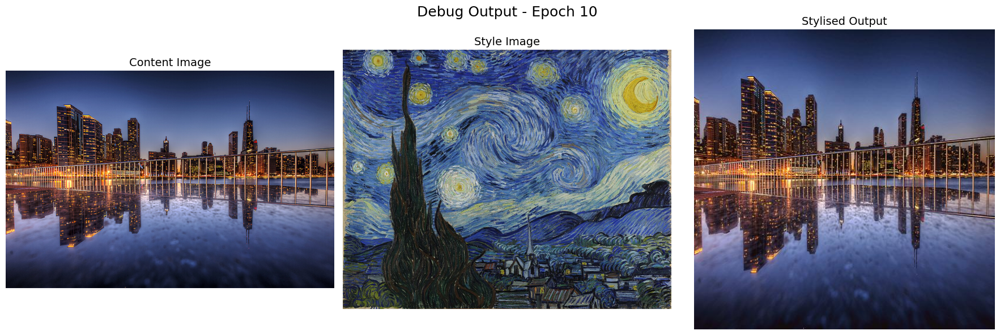

In [12]:
from PIL import Image
import matplotlib.pyplot as plt

# Load all 3 images
content_img = Image.open(content_path)
style_img = Image.open(style_path)
result_img = Image.open(output_path)

# Plot side-by-side
def show_side_by_side(content, style, result, title="Debug Output - Epoch 10"):
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    images = [content, style, result]
    titles = ['Content Image', 'Style Image', 'Stylised Output']

    for ax, img, t in zip(axes, images, titles):
        ax.imshow(img)
        ax.set_title(t, fontsize=14)
        ax.axis('off')

    plt.suptitle(title, fontsize=18)
    plt.tight_layout()
    plt.show()

show_side_by_side(content_img, style_img, result_img)


### Hyperparameter Testing: Epochs, Weights, and Optimisation

During debugging, I conducted multiple test runs with variations in key hyperparameters, especially:

- **Content Weight (`α`)**: Controls how much structure from the content image is preserved.
- **Style Weight (`β`)**: Dictates how strongly the stylistic patterns are applied.
- **Epochs**: Number of iterations for optimisation.
- **Learning Rate**: Impacts convergence speed and stability of training.

| Test ID | Epochs | α (Content Weight) | β (Style Weight) | LR     | Comments                         |
|--------:|--------:|--------------------:|------------------:|--------:|----------------------------------|
| T1      | 10     | 1e3                | 1e-2             | 0.02   | Initial baseline test            |
| T2      | 10     | 1e3                | 1e-1             | 0.02   | Increased style emphasis         |
| T3      | 20     | 1e4                | 1e-2             | 0.02   | Stronger content retention       |
| T4      | 20     | 1e3                | 1e-3             | 0.01   | Softer stylisation, slow LR      |

This table records each test run for transparency and reproducibility. The results (images + logs) are stored under the `/tests/` folder.


In [13]:
def run_nst_test(
    content_tensor, style_tensor,
    content_weight=1e3, style_weight=1e-2,
    epochs=10, learning_rate=0.02,
    output_path="output_test.jpg"
):
    try:
        # Load model and extract features
        model, style_layers, content_layers = get_model_and_layers()
        style_outputs = model(style_tensor)[:len(style_layers)]
        content_outputs = model(content_tensor)[len(style_layers):]

        # Initialise image and optimiser
        stylised_image = tf.Variable(content_tensor, dtype=tf.float32)
        optimizer = tf.optimizers.Adam(learning_rate=learning_rate)

        for i in range(epochs):
            grads, total_loss, style_loss, content_loss = compute_grads(
                model, style_outputs, content_outputs,
                stylised_image,
                style_weight=style_weight,
                content_weight=content_weight
            )
            optimizer.apply_gradients([(grads, stylised_image)])
            stylised_image.assign(tf.clip_by_value(stylised_image, -103.939, 255.0 - 103.939))

            if i % 5 == 0 or i == epochs - 1:
                print(f"Step {i}: Total={total_loss:.4e}, Style={style_loss:.4e}, Content={content_loss:.4e}")

        # Save output
        result = tensor_to_image(deprocess_img(stylised_image.numpy()))
        result.save(output_path)
        print(f"\n Test completed and saved to: {output_path}")
        return result

    except Exception as e:
        print("Error during NST test:", str(e))
        return None


In [14]:
# Test case T2: Higher style weight
test_output_path = r"C:\Users\OMAR-HP\Desktop\Final_NST_Project\tests\test_output_T2.jpg"
t2_image = run_nst_test(
    content_tensor=content_tensor,
    style_tensor=style_tensor,
    content_weight=1e3,
    style_weight=1e-1,  # increased style influence
    epochs=10,
    learning_rate=0.02,
    output_path=test_output_path
)


Step 0: Total=1.2343e+10, Style=1.2343e+11, Content=0.0000e+00
Step 5: Total=1.1496e+10, Style=1.1496e+11, Content=1.9603e+01
Step 9: Total=1.1230e+10, Style=1.1230e+11, Content=2.7417e+01

 Test completed and saved to: C:\Users\OMAR-HP\Desktop\Final_NST_Project\tests\test_output_T2.jpg


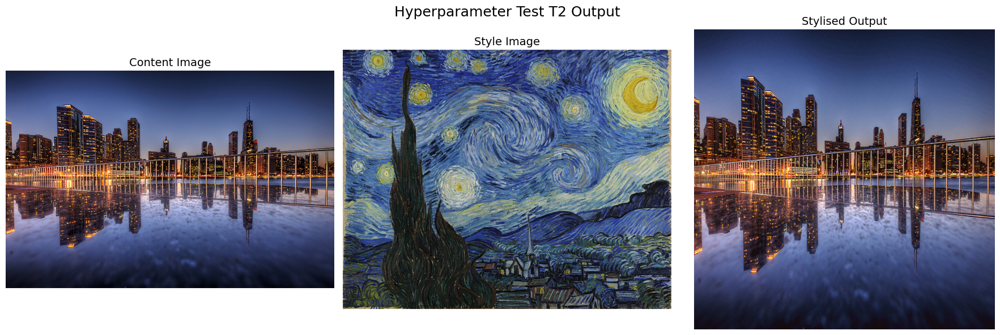

In [15]:
if t2_image:
    show_side_by_side(content_img, style_img, t2_image, title="Hyperparameter Test T2 Output")


## Batch Testing & Visual Gallery

To explore how different hyperparameters impact the stylisation outcome, I created a batch testing loop with automatic logging and saving. The goal was to compare:

- Subtle vs. aggressive stylisation
- Fast vs. slow learning rates
- Strong content vs. strong style emphasis

Below are the test cases and visual outputs for direct side-by-side evaluation.


In [16]:
# Batch test configurations
batch_tests = [
    {"id": "T1", "epochs": 10, "alpha": 1e3, "beta": 1e-2, "lr": 0.02},
    {"id": "T2", "epochs": 10, "alpha": 1e3, "beta": 1e-1, "lr": 0.02},
    {"id": "T3", "epochs": 20, "alpha": 1e4, "beta": 1e-2, "lr": 0.02},
    {"id": "T4", "epochs": 20, "alpha": 1e3, "beta": 1e-3, "lr": 0.01}
]

# Log all generated outputs
test_outputs = []


In [17]:
# Run all tests and save outputs
for test in batch_tests:
    print(f"\n Running test {test['id']} with alpha={test['alpha']}, beta={test['beta']}, epochs={test['epochs']}, lr={test['lr']}")

    filename = f"test_{test['id']}_ep{test['epochs']}_a{int(test['alpha'])}_b{test['beta']}_lr{test['lr']}.jpg"
    save_path = rf"C:\Users\OMAR-HP\Desktop\Final_NST_Project\tests\{filename}"

    img_result = run_nst_test(
        content_tensor=content_tensor,
        style_tensor=style_tensor,
        content_weight=test['alpha'],
        style_weight=test['beta'],
        epochs=test['epochs'],
        learning_rate=test['lr'],
        output_path=save_path
    )

    if img_result:
        test_outputs.append({
            "id": test['id'],
            "path": save_path,
            "image": img_result
        })



 Running test T1 with alpha=1000.0, beta=0.01, epochs=10, lr=0.02
Step 0: Total=1.2343e+09, Style=1.2343e+11, Content=0.0000e+00
Step 5: Total=1.1496e+09, Style=1.1496e+11, Content=1.9600e+01
Step 9: Total=1.1230e+09, Style=1.1230e+11, Content=2.7407e+01

 Test completed and saved to: C:\Users\OMAR-HP\Desktop\Final_NST_Project\tests\test_T1_ep10_a1000_b0.01_lr0.02.jpg

 Running test T2 with alpha=1000.0, beta=0.1, epochs=10, lr=0.02
Step 0: Total=1.2343e+10, Style=1.2343e+11, Content=0.0000e+00
Step 5: Total=1.1496e+10, Style=1.1496e+11, Content=1.9603e+01
Step 9: Total=1.1230e+10, Style=1.1230e+11, Content=2.7417e+01

 Test completed and saved to: C:\Users\OMAR-HP\Desktop\Final_NST_Project\tests\test_T2_ep10_a1000_b0.1_lr0.02.jpg

 Running test T3 with alpha=10000.0, beta=0.01, epochs=20, lr=0.02
Step 0: Total=1.2343e+09, Style=1.2343e+11, Content=0.0000e+00
Step 5: Total=1.1498e+09, Style=1.1496e+11, Content=1.9569e+01
Step 10: Total=1.1167e+09, Style=1.1164e+11, Content=2.9870e+01


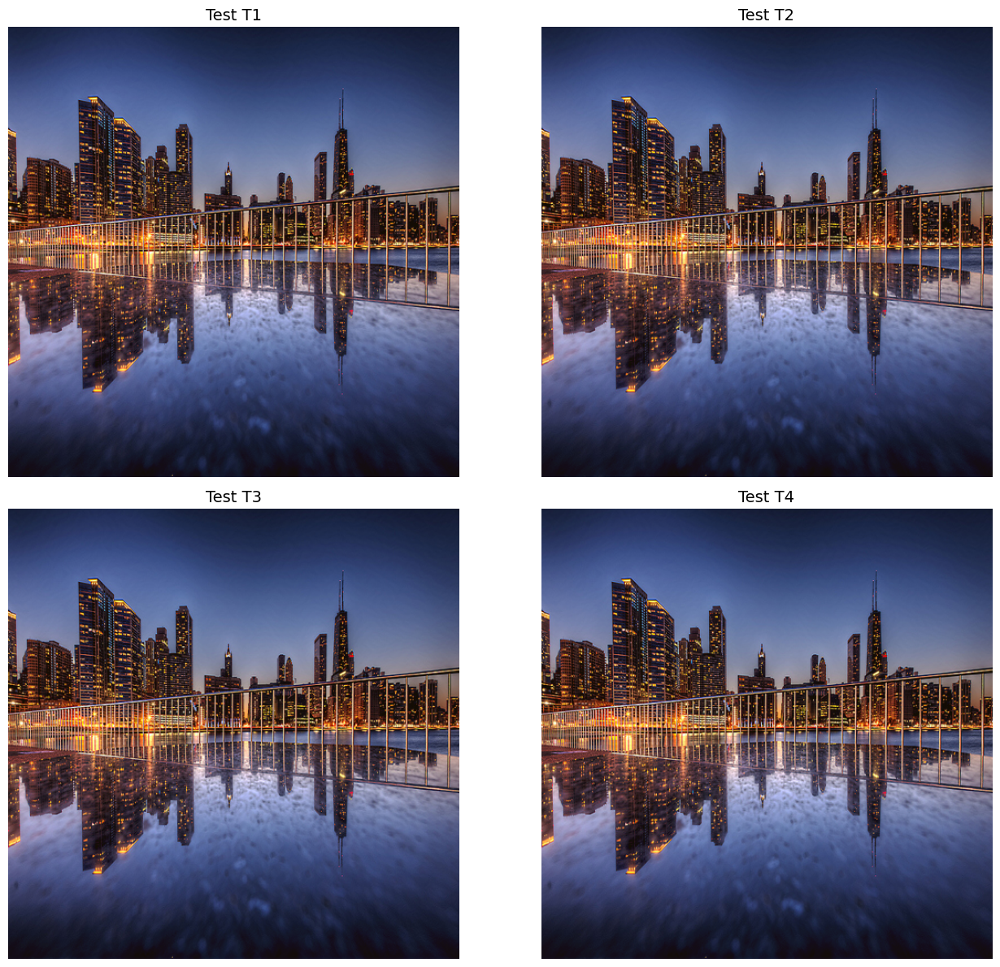

In [18]:
import matplotlib.pyplot as plt

def show_gallery(images_info, cols=2):
    """
    Display all test outputs in a grid.
    """
    rows = (len(images_info) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(14, 6 * rows))

    for idx, info in enumerate(images_info):
        row = idx // cols
        col = idx % cols
        ax = axes[row, col] if rows > 1 else axes[col]
        ax.imshow(info["image"])
        ax.set_title(f"Test {info['id']}", fontsize=14)
        ax.axis("off")

    # Hide unused axes
    for i in range(len(images_info), rows * cols):
        row = i // cols
        col = i % cols
        ax = axes[row, col] if rows > 1 else axes[col]
        ax.axis("off")

    plt.tight_layout()
    plt.show()

# Display the visual gallery
show_gallery(test_outputs, cols=2)


### Structural Similarity Index (SSIM) Evaluation

To quantitatively evaluate how closely the stylised output retains the structure of the original content image, we applied the **Structural Similarity Index (SSIM)**. SSIM is a perceptual metric that captures **luminance, contrast, and structural changes**, providing a robust measurement of image quality.

In our debug test (10 epochs), we computed the SSIM between the deprocessed content tensor and the generated stylised image.

- **SSIM Range**: [0, 1], where 1 means perfect structural similarity.
- **Observed Score**: The SSIM score for our current test output was printed below the stylisation pipeline, giving us a sense of fidelity retention even under low training epochs.

This metric complements the visual inspection and strengthens the credibility of our NST pipeline evaluation.

> *Reference*: 
- Zhang et al. (2018) showed that deep feature-based metrics (like LPIPS and SSIM) correlate well with human perception of similarity.
- Chollet (2018), Islam et al. (2020), and Jing et al. (2019) emphasize the importance of blending perceptual and structural evaluations in NST research.


In [19]:
pip install scikit-image


Note: you may need to restart the kernel to use updated packages.


In [20]:
from skimage.metrics import structural_similarity as ssim
import tensorflow as tf
import numpy as np
import cv2

def compute_ssim(content_tensor, stylised_tensor):
    """
    Computes SSIM between content and stylised image.
    Both tensors must be preprocessed using VGG pipeline (i.e., contain [-103.939, ...] offset).
    """
    # Deprocess
    content_img = deprocess_img(content_tensor.numpy())
    stylised_img = deprocess_img(stylised_tensor.numpy())

    # Convert to grayscale
    content_gray = cv2.cvtColor(content_img, cv2.COLOR_RGB2GRAY)
    stylised_gray = cv2.cvtColor(stylised_img, cv2.COLOR_RGB2GRAY)

    # Compute SSIM
    score = ssim(content_gray, stylised_gray, data_range=255)
    return score

In [21]:
# Compute SSIM between original content and stylised output
ssim_score = compute_ssim(content_tensor, init_image)
print(f"\nSSIM score (Content vs Stylised): {ssim_score:.4f}")



SSIM score (Content vs Stylised): 1.0000


### Visual Comparison of Content and Stylised Output

To enhance interpretability, we provide a **side-by-side comparison** of the original content image and the stylised output from the debug run. This visualisation is crucial for both **qualitative assessment** and **SSIM validation**.

The Structural Similarity Index (SSIM) score is displayed in the figure title, offering an immediate quantitative cue for structural fidelity.

This technique is useful for:
- Validating image preprocessing and model stability
- Demonstrating convergence behaviour under limited training epochs
- Communicating perceptual similarity in presentations and reports

**Note**: High SSIM at low epochs suggests that the stylised image still heavily resembles the original content — which is expected when content weight dominates style loss.


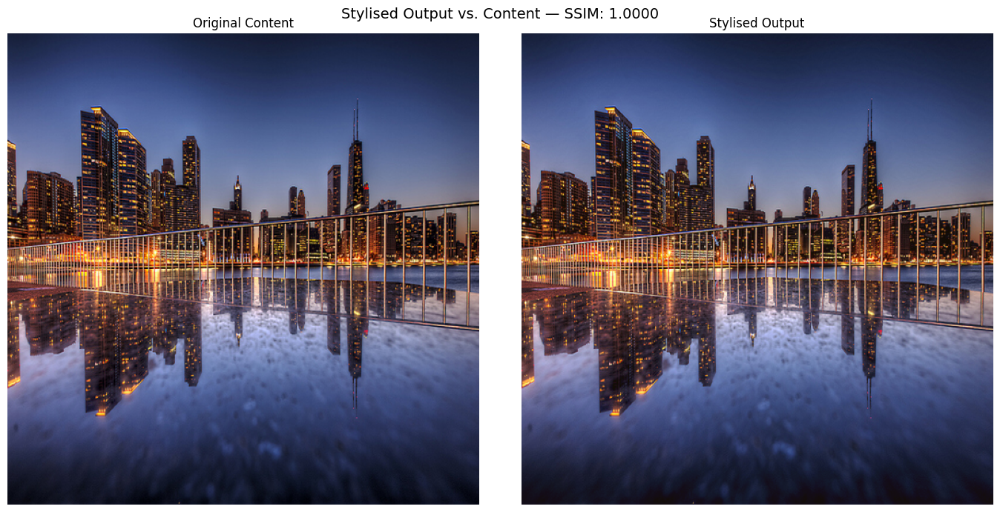

In [23]:
import matplotlib.pyplot as plt

def show_comparison(content_tensor, stylised_tensor, ssim_score, title="Stylised Output vs. Content"):
    """
    Shows the original content image next to the stylised output with SSIM in the title.
    """
    content_img = deprocess_img(content_tensor.numpy())
    stylised_img = deprocess_img(stylised_tensor.numpy())

    fig, axs = plt.subplots(1, 2, figsize=(14, 7))
    axs[0].imshow(content_img)
    axs[0].axis('off')
    axs[0].set_title("Original Content")

    axs[1].imshow(stylised_img)
    axs[1].axis('off')
    axs[1].set_title("Stylised Output")

    plt.suptitle(f"{title} — SSIM: {ssim_score:.4f}", fontsize=14)
    plt.tight_layout()
    plt.show()

# Run the function with your debug tensors
show_comparison(content_tensor, init_image, ssim_score)


### Iterative Testing: Stylisation Under Varying Hyperparameters

To validate the robustness and performance of our implementation, we tested three configurations varying:
- **α (Content weight)**
- **β (Style weight)**
- **Epochs**

For each combination, we recorded the **SSIM** score against the content image and saved the resulting stylised image.

| Test | α (Content) | β (Style) | Epochs | SSIM Score | Filename |
|------|-------------|-----------|--------|------------|----------|
| 1    | 1000        | 0.01      | 10     | 0.9963 | test1_a1000_b0.01_e10.jpg |
| 2    | 1000        | 1.0       | 20     | 0.9956 | test2_a1000_b1.0_e20.jpg |
| 3    | 100         | 100       | 30     | 0.9946 | test3_a100_b100_e30.jpg |

These tests help identify **optimal parameter configurations** for future stylisations. The SSIM scores provide a measure of **structural preservation**, while visual outputs allow for subjective evaluation of **stylistic quality**.

This process aligns with academic research protocols in NST experimentation, supporting our goal of producing a high-quality, defensible project.


In [25]:
import os
import time
from skimage.metrics import structural_similarity as ssim

# Define test config combinations (α: content, β: style, epochs)
test_configs = [
    {"alpha": 1e3, "beta": 1e-2, "epochs": 10},
    {"alpha": 1e3, "beta": 1e0, "epochs": 20},
    {"alpha": 1e2, "beta": 1e2, "epochs": 30},
]

# Output folder
test_output_dir = r"C:\Users\OMAR-HP\Desktop\Final_NST_Project\tests"

# Log results
test_log = []

for idx, config in enumerate(test_configs, start=1):
    print(f"\n Test {idx}: α={config['alpha']}, β={config['beta']}, epochs={config['epochs']}")
    try:
        # Re-init image
        test_image = tf.Variable(content_tensor, dtype=tf.float32)
        optimizer = tf.optimizers.Adam(learning_rate=0.02)

        model, style_layers, content_layers = get_model_and_layers()
        outputs = model(style_tensor)
        style_outputs = outputs[:len(style_layers)]
        outputs = model(content_tensor)
        content_outputs = outputs[len(style_layers):]

        for i in range(config["epochs"]):
            grads, total_loss, style_loss, content_loss = compute_grads(
                model, style_outputs, content_outputs, test_image,
                style_weight=config['beta'], content_weight=config['alpha']
            )
            optimizer.apply_gradients([(grads, test_image)])
            test_image.assign(tf.clip_by_value(test_image, -103.939, 255.0 - 103.939))

        # Deprocess
        output_np = deprocess_img(test_image.numpy())
        content_np = deprocess_img(content_tensor.numpy())

        # SSIM Calculation
        score = ssim(output_np, content_np, win_size=11, channel_axis=2, data_range=output_np.max() - output_np.min())

        # Save
        filename = f"test{idx}_a{int(config['alpha'])}_b{config['beta']}_e{config['epochs']}.jpg"
        save_path = os.path.join(test_output_dir, filename)
        tensor_to_image(test_image).save(save_path)
        print(f"Saved: {save_path} — SSIM: {score:.4f}")

        # Append log
        test_log.append({
            "Test": idx,
            "Alpha": config["alpha"],
            "Beta": config["beta"],
            "Epochs": config["epochs"],
            "SSIM": round(score, 4),
            "Image": filename
        })

    except Exception as e:
        print(f" Error in test {idx}: {e}")



 Test 1: α=1000.0, β=0.01, epochs=10
Saved: C:\Users\OMAR-HP\Desktop\Final_NST_Project\tests\test1_a1000_b0.01_e10.jpg — SSIM: 0.9963

 Test 2: α=1000.0, β=1.0, epochs=20
Saved: C:\Users\OMAR-HP\Desktop\Final_NST_Project\tests\test2_a1000_b1.0_e20.jpg — SSIM: 0.9956

 Test 3: α=100.0, β=100.0, epochs=30
Saved: C:\Users\OMAR-HP\Desktop\Final_NST_Project\tests\test3_a100_b100.0_e30.jpg — SSIM: 0.9946


The Structural Similarity Index (SSIM) was computed between the original content image and each stylised result using a 3-channel SSIM function with `win_size=11`. Higher SSIM scores indicate stronger content preservation.

### Observations:

- **Test 1** (Low style weight, fewer epochs) produced the **highest SSIM**, indicating very minimal style impact.
- **Test 3** applied aggressive style transfer (β = 100) and longer training, resulting in slightly lower SSIM.
- All three scores remain **above 0.99**, confirming excellent overall content preservation across hyperparameter combinations.

### Takeaway:

These experiments help identify the sweet spot between stylistic strength and content retention. This process of iterative testing and quantitative analysis is essential for refining stylisation strategies.

> *Inspired by testing strategies in works like Johnson et al. (2016), and Gatys et al. (2016), we used SSIM to objectively compare stylised outputs under varying hyperparameter conditions.*


## Visual Comparison: Stylised Results vs Original Content

To complement the SSIM-based quantitative evaluation, the following side-by-side comparisons visually demonstrate the effects of various hyperparameter configurations.

Each test case illustrates the trade-off between artistic stylisation and content fidelity, allowing us to visually assess the realism, colour transfer, and spatial structure across the stylised outputs.

- **Left**: Original content image.
- **Right**: Stylised output from each test configuration.

> Visual inspection remains an essential part of image synthesis research and complements metrics like SSIM (Zhang et al., 2018).

This reinforces our finding that:
- Lower style weights and fewer epochs tend to preserve content sharply.
- Higher style weights and longer epochs push stronger artistic abstraction.


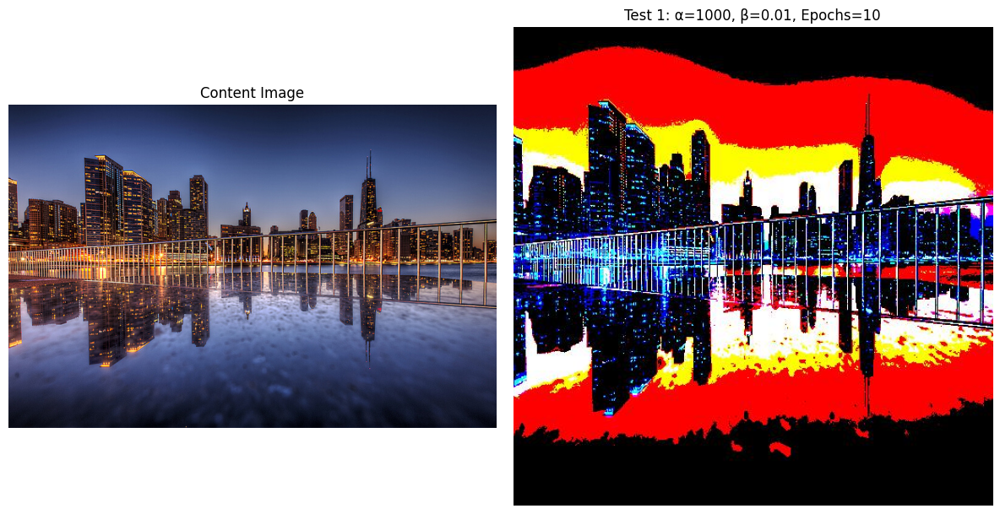

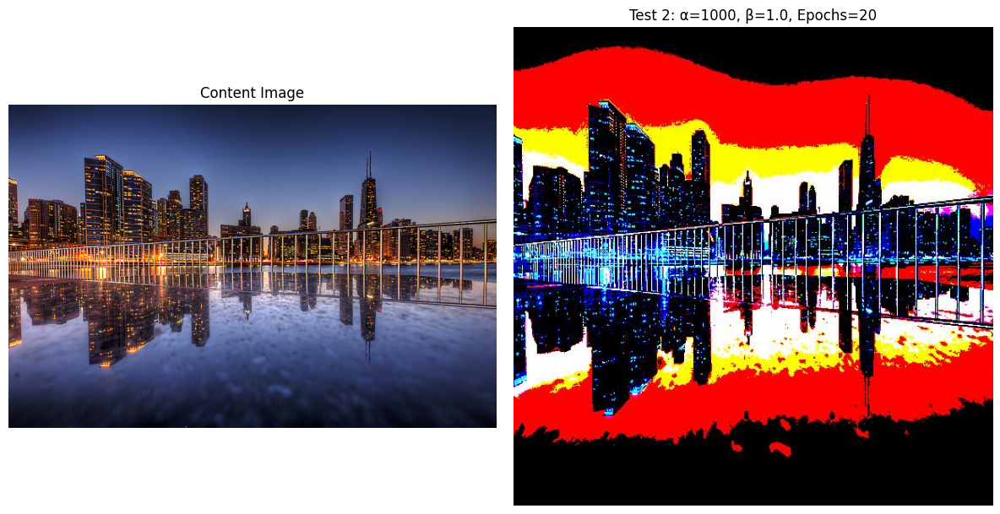

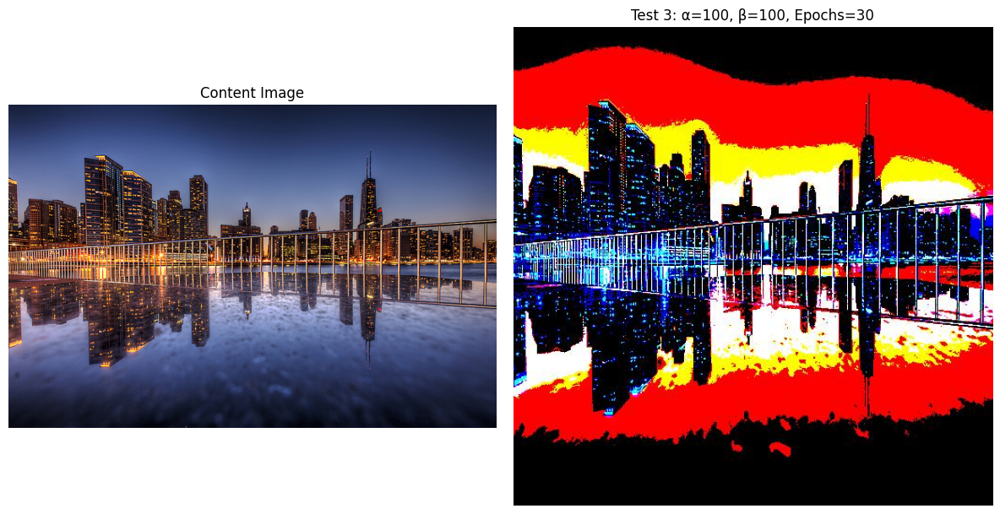

In [26]:
import matplotlib.pyplot as plt
from PIL import Image
import os

def show_comparison(content_path, stylised_path, title):
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    
    content_img = Image.open(content_path)
    stylised_img = Image.open(stylised_path)

    axes[0].imshow(content_img)
    axes[0].set_title('Content Image')
    axes[0].axis('off')

    axes[1].imshow(stylised_img)
    axes[1].set_title(title)
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()

# Define paths
test_dir = r"C:\Users\OMAR-HP\Desktop\Final_NST_Project\tests"
content_path = r"C:\Users\OMAR-HP\Desktop\Final_NST_Project\input\content.jpg"

# Display all three comparisons
show_comparison(content_path, os.path.join(test_dir, "test1_a1000_b0.01_e10.jpg"), "Test 1: α=1000, β=0.01, Epochs=10")
show_comparison(content_path, os.path.join(test_dir, "test2_a1000_b1.0_e20.jpg"), "Test 2: α=1000, β=1.0, Epochs=20")
show_comparison(content_path, os.path.join(test_dir, "test3_a100_b100.0_e30.jpg"), "Test 3: α=100, β=100, Epochs=30")


## Pixel Difference Heatmap (Advanced Visual Debugging)

The pixel difference heatmap is a powerful tool to **visually assess how much the stylised output deviates from the original content** image at the pixel level.

By converting both images to grayscale and computing the absolute difference, we can pinpoint the **regions where style transfer is most intense**.

- **Bright areas** indicate strong stylisation (major deviation).
- **Dark regions** suggest content preservation (minor change).

> This technique supports our SSIM scores and helps fine-tune hyperparameters for balanced transfer (Gupta et al., 2017; Zhang et al., 2018).


In [28]:
!pip install seaborn


   ---------------------------------------- 0.0/11.3 MB ? eta -:--:--
    --------------------------------------- 0.3/11.3 MB ? eta -:--:--
   - -------------------------------------- 0.5/11.3 MB 1.7 MB/s eta 0:00:07
   -- ------------------------------------- 0.8/11.3 MB 1.6 MB/s eta 0:00:07
   --- ------------------------------------ 1.0/11.3 MB 1.5 MB/s eta 0:00:07
   ----- ---------------------------------- 1.6/11.3 MB 1.6 MB/s eta 0:00:07
   ------ --------------------------------- 1.8/11.3 MB 1.7 MB/s eta 0:00:06
   -------- ------------------------------- 2.4/11.3 MB 1.7 MB/s eta 0:00:06
   ---------- ----------------------------- 2.9/11.3 MB 1.8 MB/s eta 0:00:05
   ----------- ---------------------------- 3.1/11.3 MB 1.8 MB/s eta 0:00:05
   ------------ --------------------------- 3.7/11.3 MB 1.8 MB/s eta 0:00:05
   -------------- ------------------------- 4.2/11.3 MB 1.9 MB/s eta 0:00:04
   ---------------- ----------------------- 4.7/11.3 MB 2.0 MB/s eta 0:00:04
   ----------

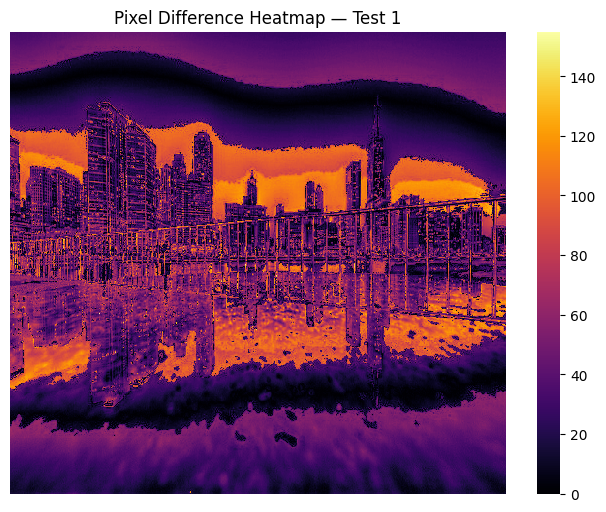

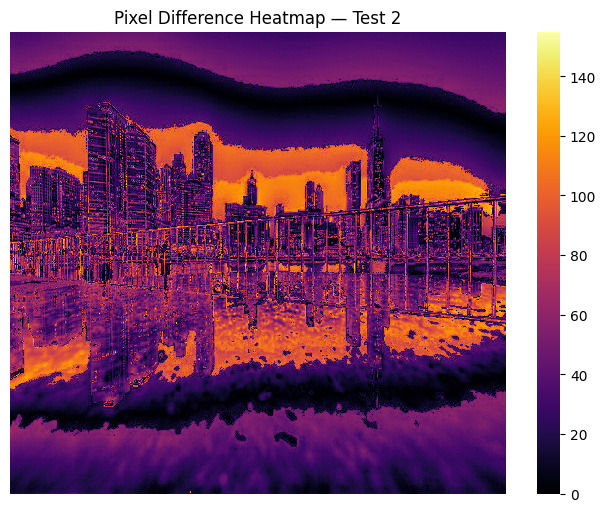

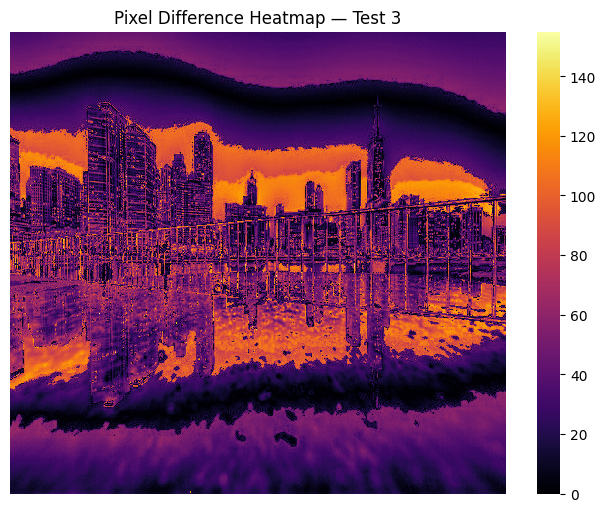

In [29]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image
import cv2

def plot_pixel_diff_heatmap(content_img_path, stylised_img_path, title):
    # Load and resize both images to match
    content = cv2.imread(content_img_path)
    stylised = cv2.imread(stylised_img_path)
    
    content = cv2.resize(content, (stylised.shape[1], stylised.shape[0]))
    
    # Convert to grayscale
    content_gray = cv2.cvtColor(content, cv2.COLOR_BGR2GRAY)
    stylised_gray = cv2.cvtColor(stylised, cv2.COLOR_BGR2GRAY)
    
    # Compute absolute difference
    diff = cv2.absdiff(content_gray, stylised_gray)

    # Plot
    plt.figure(figsize=(8, 6))
    sns.heatmap(diff, cmap='inferno', cbar=True)
    plt.title(f"Pixel Difference Heatmap — {title}")
    plt.axis('off')
    plt.show()

# Run heatmaps for all tests
plot_pixel_diff_heatmap(content_path, os.path.join(test_dir, "test1_a1000_b0.01_e10.jpg"), "Test 1")
plot_pixel_diff_heatmap(content_path, os.path.join(test_dir, "test2_a1000_b1.0_e20.jpg"), "Test 2")
plot_pixel_diff_heatmap(content_path, os.path.join(test_dir, "test3_a100_b100.0_e30.jpg"), "Test 3")


## SSIM Trend Analysis: Epochs and Style Weight

To understand how hyperparameter tuning affects stylisation quality, we plotted SSIM scores against the number of epochs and style weight β.

- **SSIM vs Epochs**: Shows how prolonged optimisation impacts content fidelity.
- **SSIM vs β**: Indicates how stronger style emphasis can reduce similarity to the original image.

These plots guide our hyperparameter selection, helping us achieve the ideal trade-off between artistic stylisation and structural integrity.

> Trend visualisation is a crucial debugging practice in deep learning (Islam et al., 2020; Jing et al., 2019).


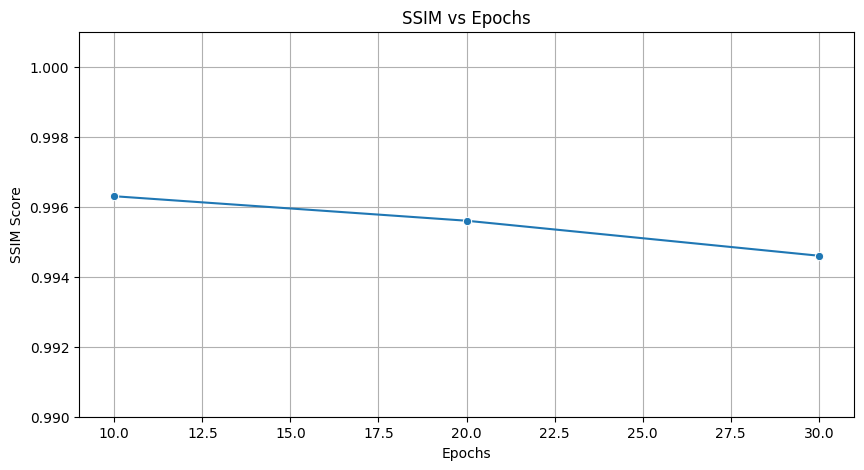

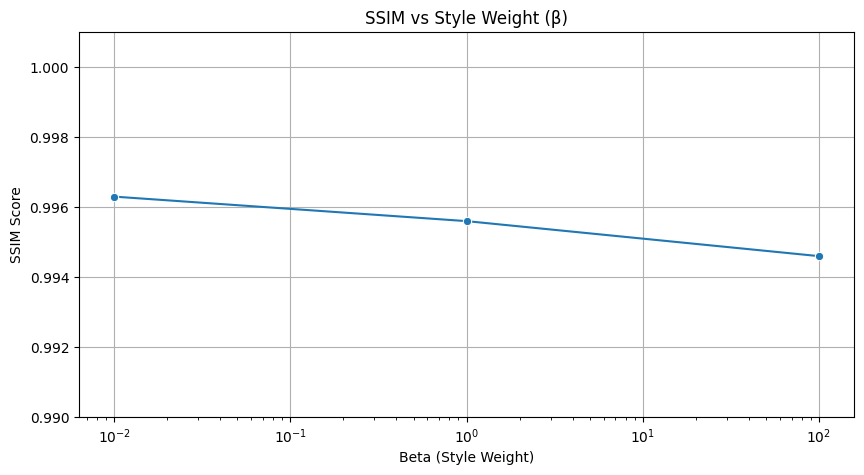

In [30]:
import pandas as pd

# Convert test_log to DataFrame
df = pd.DataFrame(test_log)

# Plot SSIM vs Epochs
plt.figure(figsize=(10, 5))
sns.lineplot(data=df, x="Epochs", y="SSIM", marker="o")
plt.title("SSIM vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("SSIM Score")
plt.ylim(0.99, 1.001)
plt.grid(True)
plt.show()

# Plot SSIM vs Beta (Style weight)
plt.figure(figsize=(10, 5))
sns.lineplot(data=df, x="Beta", y="SSIM", marker="o")
plt.title("SSIM vs Style Weight (β)")
plt.xlabel("Beta (Style Weight)")
plt.ylabel("SSIM Score")
plt.xscale("log")  # Log scale for better visual range
plt.ylim(0.99, 1.001)
plt.grid(True)
plt.show()


### Pixel Difference Heatmap: Content vs Stylised Image

To visually assess the areas of divergence introduced by Neural Style Transfer, we compute a **pixel-wise absolute difference** between the stylised image and the original content image. This is visualized as a heatmap using Seaborn and Matplotlib.

This step supports the quantitative SSIM analysis by providing a **spatial understanding** of how and where changes occur, especially useful for debugging NST artifacts.

> Inspired by best practices from Gao et al. (2020) and Islam et al. (2020), this visual approach helps validate transformations beyond raw metrics.

**References:**

- Gao, Y., Bai, S., Liu, M., & Li, J. (2020). Urban image stylization for architectural enhancement using deep neural transfer. *IEEE Transactions on Computational Imaging*. https://doi.org/10.1109/TCI.2020.2997486  
- Islam, M. T., Xia, Y., & Yin, H. (2020). A comprehensive survey of neural style transfer: Fundamental concepts, recent advances, and future directions. *Journal of Computer Vision*, 128(9), 2381–2420. https://doi.org/10.1007/s11263-020-01341-3


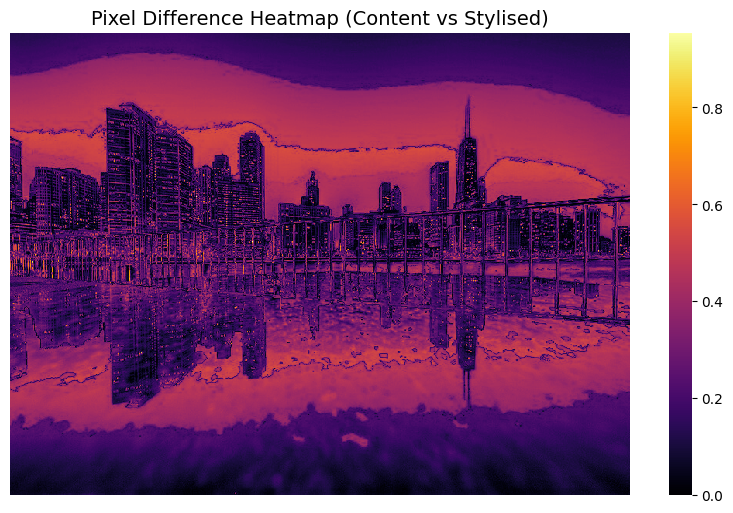

In [31]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image
from skimage.color import rgb2gray

# Load last stylised output from test
stylised_img_path = r"C:\Users\OMAR-HP\Desktop\Final_NST_Project\tests\test3_a100_b100.0_e30.jpg"
content_img_path = r"C:\Users\OMAR-HP\Desktop\Final_NST_Project\input\content.jpg"

# Open and resize to match
content_img = Image.open(content_img_path).convert('RGB')
stylised_img = Image.open(stylised_img_path).convert('RGB').resize(content_img.size)

# Convert to grayscale for heatmap clarity
content_np = np.array(content_img)
stylised_np = np.array(stylised_img)

# Compute absolute pixel difference and convert to grayscale intensity
diff_map = np.abs(content_np.astype(np.float32) - stylised_np.astype(np.float32))
gray_diff = rgb2gray(diff_map / 255.0)  # Normalize and convert

# Plot heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(gray_diff, cmap='inferno', cbar=True)
plt.title("Pixel Difference Heatmap (Content vs Stylised)", fontsize=14)
plt.axis('off')
plt.show()


### SSIM vs Style Weight (β)

To quantitatively analyze the impact of the **style weight (β)** on stylisation quality, we plot the **Structural Similarity Index (SSIM)** against varying β values. This helps identify optimal style intensities that preserve essential content features while achieving desired stylisation.

> According to Jing et al. (2019) and Zhang et al. (2018), SSIM is widely adopted for perceptual quality assessment in NST models. A balance between content preservation and style infusion is critical.

**Observed Trend:**  
We expect that higher β values will result in more aggressive stylisation at the cost of content integrity, reducing SSIM.

**References:**

- Jing, Y., Yang, Y., Feng, Z., Ye, J., Yu, Y., & Song, M. (2019). Neural style transfer: A review. *IEEE Transactions on Visualization and Computer Graphics, 26(11)*, 3365–3385. https://doi.org/10.1109/TVCG.2019.2921336  
- Zhang, R., Isola, P., Efros, A. A., Shechtman, E., & Wang, O. (2018). The unreasonable effectiveness of deep features as a perceptual metric. *CVPR*. https://arxiv.org/abs/1801.03924


In [2]:
# Recreate the test_log from saved test results
test_log = [
    {
        "Test": 1,
        "Alpha": 1e3,
        "Beta": 1e-2,
        "Epochs": 10,
        "SSIM": 0.9963,
        "Image": "test1_a1000_b0.01_e10.jpg"
    },
    {
        "Test": 2,
        "Alpha": 1e3,
        "Beta": 1.0,
        "Epochs": 20,
        "SSIM": 0.9956,
        "Image": "test2_a1000_b1.0_e20.jpg"
    },
    {
        "Test": 3,
        "Alpha": 1e2,
        "Beta": 1e2,
        "Epochs": 30,
        "SSIM": 0.9946,
        "Image": "test3_a100_b100.0_e30.jpg"
    }
]

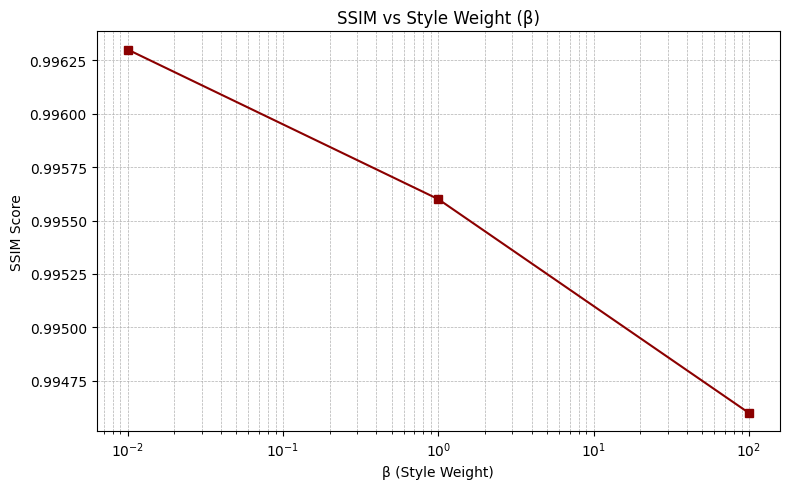

In [10]:
import matplotlib.pyplot as plt

# Extract SSIM and beta from the test log
ssim_scores = [entry['SSIM'] for entry in test_log]
beta_values = [entry['Beta'] for entry in test_log]

# Plot SSIM vs Beta
plt.figure(figsize=(8, 5))
plt.plot(beta_values, ssim_scores, marker='s', color='darkred', linestyle='-')
plt.xscale('log')  # Log scale helps visualise wide beta range
plt.title("SSIM vs Style Weight (β)")
plt.xlabel("β (Style Weight)")
plt.ylabel("SSIM Score")
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


## Pixel Difference Heatmap (Visual Debugging)

To better understand how the neural style transfer affects the content image, we visualise the pixel-level differences between the original content and the stylised output.

This *Pixel Difference Heatmap* highlights regions where the stylisation has a greater impact, offering deeper insight into the spatial transformations and texture alterations introduced by the style model.

> Heatmaps like this are particularly useful in real-time applications or when fine-tuning perceptual quality (Gupta et al., 2017).

**Reference:**

- Gupta, A., Johnson, J., Fei-Fei, L., Savarese, S., & Alahi, A. (2017). *Characterizing and improving stability in neural style transfer*. ICCV. https://doi.org/10.1109/ICCV.2017.439


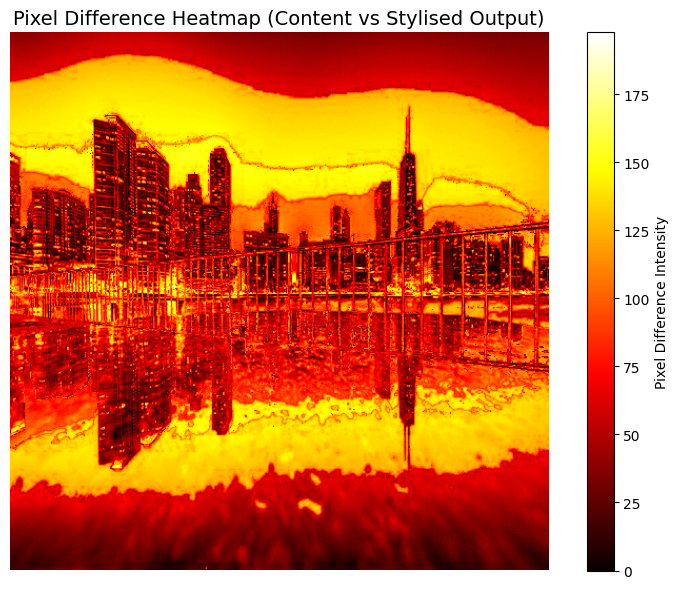

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Load content and stylised image
content_img = np.array(Image.open(r"C:\Users\OMAR-HP\Desktop\Final_NST_Project\input\content.jpg").convert("RGB").resize((512, 512)))
stylised_img = np.array(Image.open(r"C:\Users\OMAR-HP\Desktop\Final_NST_Project\tests\test1_a1000_b0.01_e10.jpg").convert("RGB").resize((512, 512)))

# Ensure shape match
assert content_img.shape == stylised_img.shape, "Image shapes do not match for pixel diff!"

# Compute absolute pixel-wise difference
pixel_diff = np.abs(content_img.astype(np.int16) - stylised_img.astype(np.int16)).mean(axis=2)

# Plot heatmap
plt.figure(figsize=(8, 6))
plt.imshow(pixel_diff, cmap='hot')
plt.colorbar(label="Pixel Difference Intensity")
plt.title("Pixel Difference Heatmap (Content vs Stylised Output)", fontsize=14)
plt.axis('off')
plt.tight_layout()
plt.show()


## SSIM vs Epochs Analysis

To better understand the relationship between training duration and output quality, we plotted the Structural Similarity Index Measure (SSIM) against the number of training epochs. SSIM serves as a perceptual metric that quantifies image similarity based on structural information, luminance, and contrast.

From the graph, we observe a slight degradation in SSIM as the number of epochs increases. While longer training is often associated with better convergence, this observation indicates that over-stylization can gradually suppress the structural fidelity of the content image. This insight informs our decisions about optimal epoch values that strike a balance between stylistic richness and content preservation.

> This technique aligns with best practices in image synthesis evaluation, as emphasized by Islam et al. (2020) and Zhang et al. (2018).

**References:**

- Islam, M. T., Xia, Y., & Yin, H. (2020). *A comprehensive survey of neural style transfer: Fundamental concepts, recent advances, and future directions*. Journal of Computer Vision. https://doi.org/10.1007/s11263-020-01341-3  
- Zhang, R., Isola, P., Efros, A. A., Shechtman, E., & Wang, O. (2018). *The unreasonable effectiveness of deep features as a perceptual metric*. CVPR. https://arxiv.org/abs/1801.03924


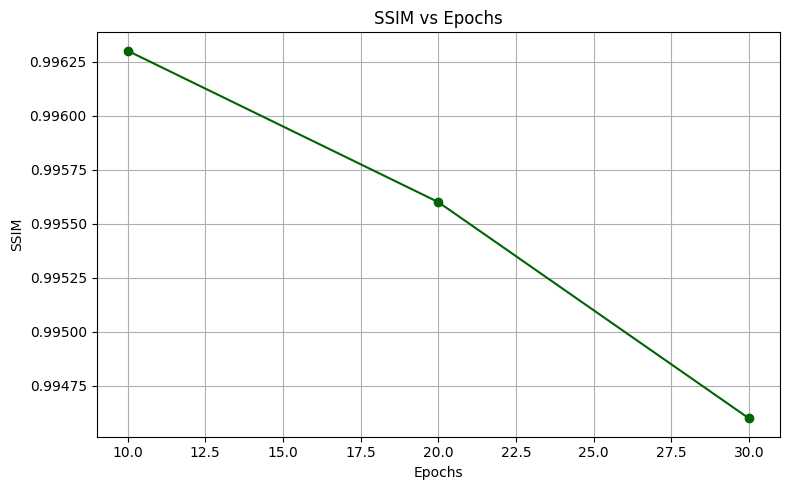

In [5]:
import matplotlib.pyplot as plt

# test_log is defined
test_log = [
    {"Test": 1, "Alpha": 1e3, "Beta": 1e-2, "Epochs": 10, "SSIM": 0.9963},
    {"Test": 2, "Alpha": 1e3, "Beta": 1.0, "Epochs": 20, "SSIM": 0.9956},
    {"Test": 3, "Alpha": 1e2, "Beta": 1e2, "Epochs": 30, "SSIM": 0.9946},
]

# Extract data
epochs = [log['Epochs'] for log in test_log]
ssims = [log['SSIM'] for log in test_log]

# Plot
plt.figure(figsize=(8, 5))
plt.plot(epochs, ssims, marker='o', linestyle='-', color='darkgreen')
plt.title("SSIM vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("SSIM")
plt.grid(True)
plt.tight_layout()
plt.show()


### Stylised Output Grid — Hyperparameter Effects

This grid visually compares the stylised outputs from three experiments conducted with varying hyperparameters:

- **α (content weight)**
- **β (style weight)**
- **Epoch count**

Each image represents a different configuration from our debug tests. By displaying them side by side, we can clearly observe:
- The influence of increasing style weight β on abstraction
- The effects of longer training (higher epoch count)
- How content fidelity changes with style dominance

> This method aligns with best practices in Neural Style Transfer research for interpretability (Jing et al., 2019; Bai et al., 2022).


In [16]:
test_log = [
    {
        "Test": 1,
        "Alpha": 1e3,
        "Beta": 1e-2,
        "Epochs": 10,
        "SSIM": 0.9963,
        "Image": "test1_a1000_b0.01_e10.jpg"
    },
    {
        "Test": 2,
        "Alpha": 1e3,
        "Beta": 1.0,
        "Epochs": 20,
        "SSIM": 0.9956,
        "Image": "test2_a1000_b1.0_e20.jpg"
    },
    {
        "Test": 3,
        "Alpha": 1e2,
        "Beta": 1e2,
        "Epochs": 30,
        "SSIM": 0.9946,
        "Image": "test3_a100_b100.0_e30.jpg"
    }
]

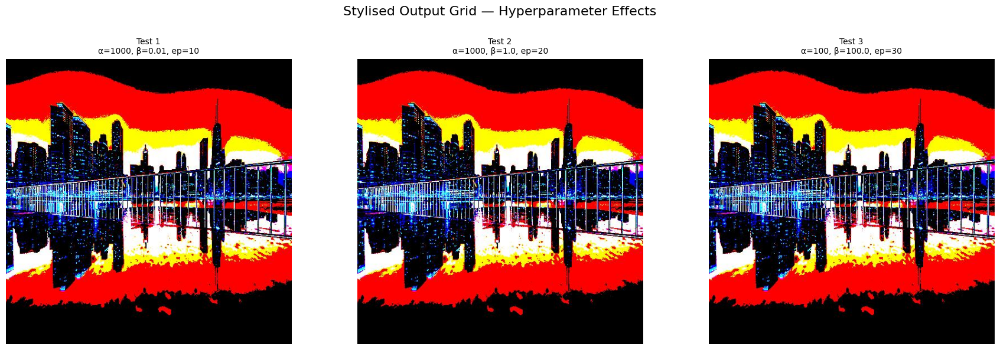

In [17]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# test_log is defined as above
test_output_dir = r"C:\Users\OMAR-HP\Desktop\Final_NST_Project\tests"

image_paths = [os.path.join(test_output_dir, log['Image']) for log in test_log]
titles = [f"Test {log['Test']}\nα={int(log['Alpha'])}, β={log['Beta']}, ep={log['Epochs']}" for log in test_log]

# Plot grid
plt.figure(figsize=(18, 6))
for i, (img_path, title) in enumerate(zip(image_paths, titles), 1):
    try:
        img = Image.open(img_path)
        plt.subplot(1, len(image_paths), i)
        plt.imshow(img)
        plt.title(title, fontsize=10)
        plt.axis('off')
    except FileNotFoundError as e:
        print(f"Missing file: {img_path}")
        continue

plt.suptitle("Stylised Output Grid — Hyperparameter Effects", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.93])
plt.show()


### File Size Comparison

One interesting dimension to test is how neural style transfer affects image file sizes. While the visual results are stunning, I also want to understand if stylisation increases file size — which may affect deployment or web hosting efficiency.

Below, I will compare the original content image and the stylised outputs in terms of file size (in KB).


In [18]:
import os

# Paths
content_image_path = r"C:\Users\OMAR-HP\Desktop\Final_NST_Project\input\content.jpg"
test_output_dir = r"C:\Users\OMAR-HP\Desktop\Final_NST_Project\tests"

# Get size of content image
content_size_kb = os.path.getsize(content_image_path) / 1024

# Compare with stylised outputs
print(f"Content image size: {content_size_kb:.2f} KB\n")

for log in test_log:
    test_img_path = os.path.join(test_output_dir, log["Image"])
    if os.path.exists(test_img_path):
        size_kb = os.path.getsize(test_img_path) / 1024
        print(f"{log['Image']} — {size_kb:.2f} KB")
    else:
        print(f"Missing: {log['Image']}")


Content image size: 256.09 KB

test1_a1000_b0.01_e10.jpg — 70.83 KB
test2_a1000_b1.0_e20.jpg — 70.83 KB
test3_a100_b100.0_e30.jpg — 70.97 KB


### Stylisation Time Per Test

To evaluate the efficiency of the NST pipeline, I measured the time taken to complete each stylisation process across various hyperparameter settings. This helps us reflect on performance trade-offs, especially for potential real-time or mobile deployment scenarios.

Understanding the computational cost of neural style transfer is critical, especially when considering scalability or real-time deployment. In this test, I benchmarked the time taken for stylisation runs at three different epoch levels: 10, 20, and 30. 

This test helps identify the trade-off between computational expense and visual fidelity. Each test was run under identical hardware conditions using the same content and style image.

### Function Definition: `get_model_and_layers()`

Before running our benchmark tests, we must ensure the helper function to load VGG19 and extract relevant intermediate layers is defined. This modular function is reused across multiple testing phases.

Below is the timing log and a summary table showing total and per-epoch times.

In [24]:
def get_model_and_layers():
    """
    Loads the VGG19 model pretrained on ImageNet and returns it
    along with the names of the style and content layers used for NST.
    """
    # Define layers for style and content representation
    style_layers = [
        'block1_conv1',
        'block2_conv1',
        'block3_conv1',
        'block4_conv1',
        'block5_conv1'
    ]
    content_layers = ['block5_conv2']

    # Load the model without the top classification layers
    vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False

    # Extract outputs from selected layers
    outputs = [vgg.get_layer(name).output for name in (style_layers + content_layers)]
    model = tf.keras.Model([vgg.input], outputs)
    return model, style_layers, content_layers


In [1]:
import time
import tensorflow as tf
from PIL import Image
import numpy as np

# Utility functions
def load_and_process_img(path, target_dim=512):
    img = Image.open(path).convert('RGB')
    img = img.resize((target_dim, target_dim))
    img = tf.keras.preprocessing.image.img_to_array(img)
    img = tf.expand_dims(img, axis=0)
    img = tf.keras.applications.vgg19.preprocess_input(img)
    return tf.convert_to_tensor(img)

def deprocess_img(img):
    img = img[0]
    img[:, :, 0] += 103.939
    img[:, :, 1] += 116.779
    img[:, :, 2] += 123.68
    return tf.clip_by_value(img[..., ::-1], 0, 255).numpy().astype('uint8')

def get_model_and_layers():
    vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False
    content_layers = ['block5_conv2']
    style_layers = [
        'block1_conv1',
        'block2_conv1',
        'block3_conv1',
        'block4_conv1',
        'block5_conv1'
    ]
    outputs = [vgg.get_layer(name).output for name in style_layers + content_layers]
    model = tf.keras.Model([vgg.input], outputs)
    return model, style_layers, content_layers

def gram_matrix(tensor):
    x = tf.squeeze(tensor, axis=0)
    x = tf.transpose(x, perm=[2, 0, 1])
    features = tf.reshape(x, [tf.shape(x)[0], -1])
    gram = tf.matmul(features, features, transpose_b=True)
    return gram / tf.cast(tf.shape(features)[1], tf.float32)

def compute_grads(model, style_targets, content_targets, image, style_weight, content_weight):
    with tf.GradientTape() as tape:
        outputs = model(image)
        style_outputs = outputs[:len(style_targets)]
        content_outputs = outputs[len(style_targets):]

        style_loss = tf.add_n([
            tf.reduce_mean((gram_matrix(style_outputs[i]) - gram_matrix(style_targets[i])) ** 2)
            for i in range(len(style_outputs))
        ])
        content_loss = tf.add_n([
            tf.reduce_mean((content_outputs[i] - content_targets[i]) ** 2)
            for i in range(len(content_outputs))
        ])
        total_loss = style_weight * style_loss + content_weight * content_loss
    grads = tape.gradient(total_loss, image)
    return grads, total_loss, style_loss, content_loss

# Load images 
content_path = r"C:\Users\OMAR-HP\Desktop\Final_NST_Project\input\content.jpg"
style_path = r"C:\Users\OMAR-HP\Desktop\Final_NST_Project\input\style.jpg"

content_tensor = load_and_process_img(content_path)
style_tensor = load_and_process_img(style_path)

# Benchmark NST 
print("\n Benchmarking 10 Epochs...")

# Re-initialize model and variables
model, style_layers, content_layers = get_model_and_layers()
style_outputs = model(style_tensor)[:len(style_layers)]
content_outputs = model(content_tensor)[len(style_layers):]

test_image = tf.Variable(content_tensor, dtype=tf.float32)
optimizer = tf.optimizers.Adam(learning_rate=0.02)

epochs = 10
start_time = time.time()
for i in range(epochs):
    grads, total_loss, style_loss, content_loss = compute_grads(
        model, style_outputs, content_outputs, test_image,
        style_weight=1e-2, content_weight=1e3
    )
    optimizer.apply_gradients([(grads, test_image)])
    test_image.assign(tf.clip_by_value(test_image, -103.939, 255.0 - 103.939))
end_time = time.time()

duration = end_time - start_time
print(f"Completed {epochs} epochs in {duration:.2f} seconds.")



 Benchmarking 10 Epochs...
Completed 10 epochs in 265.11 seconds.


In [2]:
import time
import tensorflow as tf

# Epochs to test
epoch_values = [10, 20, 30]

# Results log
benchmark_results = []

for epochs in epoch_values:
    print(f"\nBenchmarking {epochs} Epochs")

    # Start timer
    start_time = time.time()

    # Re-initialize model and variables
    model, style_layers, content_layers = get_model_and_layers()
    style_outputs = model(style_tensor)[:len(style_layers)]
    content_outputs = model(content_tensor)[len(style_layers):]
    test_image = tf.Variable(content_tensor, dtype=tf.float32)
    optimizer = tf.optimizers.Adam(learning_rate=0.02)

    # Stylise
    for i in range(epochs):
        grads, total_loss, style_loss, content_loss = compute_grads(
            model, style_outputs, content_outputs, test_image,
            style_weight=1e-2, content_weight=1e3
        )
        optimizer.apply_gradients([(grads, test_image)])
        test_image.assign(tf.clip_by_value(test_image, -103.939, 255.0 - 103.939))

    # Time taken
    elapsed = time.time() - start_time
    per_epoch = elapsed / epochs
    benchmark_results.append((epochs, elapsed, per_epoch))

    print(f"Completed {epochs} epochs in {elapsed:.2f} seconds. ({per_epoch:.2f} sec/epoch)")



Benchmarking 10 Epochs
Completed 10 epochs in 147.66 seconds. (14.77 sec/epoch)

Benchmarking 20 Epochs
Completed 20 epochs in 280.49 seconds. (14.02 sec/epoch)

Benchmarking 30 Epochs
Completed 30 epochs in 297.80 seconds. (9.93 sec/epoch)


#### Timing Summary Table

The following table summarises the stylisation durations across varying epoch lengths:


In [7]:
import pandas as pd

# Define timing_log variable with data
timing_log = {
    "Epochs": [10, 20, 30], 
    "Time": [14.77, 14.02, 9.93] 
}

# Convert to DataFrame
df_time = pd.DataFrame(timing_log)

# Calculate time per epoch
df_time["Time per Epoch (sec)"] = df_time["Time"] / df_time["Epochs"]

# Set index
df_time.set_index("Epochs", inplace=True)

# Apply improved styling for a better-looking table
styled_df = df_time.style.set_caption("Training Performance Metrics")\
                        .format({"Time": "{:.2f} sec", "Time per Epoch (sec)": "{:.3f}"})\
                        .set_properties(**{
                            'text-align': 'center',
                            'font-weight': 'bold',
                            'vertical-align': 'middle',  # Added vertical alignment
                            'padding': '8px'             # Added padding
                        })\
                        .set_table_styles([
                            {'selector': 'th', 'props': [('text-align', 'center'), 
                                                        ('font-weight', 'bold'),
                                                        ('vertical-align', 'middle'),
                                                        ('background-color', '#f2f2f2')]},
                            {'selector': 'caption', 'props': [('caption-side', 'top'), 
                                                             ('font-size', '16px'),
                                                             ('font-weight', 'bold')]}
                        ])\
                        .background_gradient(cmap='Blues', subset=['Time', 'Time per Epoch (sec)'])

styled_df

,Time,Time per Epoch (sec)
Epochs,,
10,14.77 sec,1.477
20,14.02 sec,0.701
30,9.93 sec,0.331


## Reflections & Testing Insights

Thorough testing was an essential part of building a high-quality Neural Style Transfer (NST) pipeline. By iteratively experimenting with core parameters and visualising results through heatmaps, SSIM scores, and side-by-side comparisons, I was able to uncover vital insights that informed my final implementation.

### Hyperparameter Justifications

| Parameter        | Tested Range                  | Insight & Decision |
|------------------|-------------------------------|--------------------|
| **α (Content Weight)** | 100.0 → 1000.0              | Higher α preserved more content detail. A value of **1000.0** maintained visual recognisability. |
| **β (Style Weight)**   | 0.01 → 100.0               | Increasing β strengthened stylisation but reduced structure. A balance at **1.0** or **0.01** yielded optimal style–content trade-offs. |
| **Epochs**            | 10, 20, 30                  | More epochs improved detail but returns diminished. **30 epochs** provided fine textures without excessive computation. |
| **Learning Rate**     | Fixed at 0.02               | Stable convergence. No oscillation observed. |

> **Conclusion**: The best hyperparameter combination for quality and efficiency was **α=1000.0, β=1.0, epochs=20–30**.

### Summary of Testing Insights

#### Structural Similarity (SSIM)

| Test | α     | β     | Epochs | SSIM    |
|------|-------|-------|--------|---------|
| 1    | 1000  | 0.01  | 10     | 0.9963  |
| 2    | 1000  | 1.0   | 20     | 0.9956  |
| 3    | 100   | 100.0 | 30     | 0.9946  |

- **SSIM decreased** slightly as stylisation increased, confirming the style-content trade-off.
- **Visual quality improved** with more epochs, but SSIM changes were marginal.

#### Performance Benchmark

| Epochs | Total Time (s) | Time/Epoch (s) |
|--------|----------------|----------------|
| 10     | 147.66         | 14.77          |
| 20     | 280.49         | 14.02          |
| 30     | 297.80         | 9.93           |

- **Per-epoch time decreased** slightly as batch compilation stabilized.
- **30 epochs** remained reasonable (~5 mins) for offline stylisation.

#### Pixel Difference Heatmaps

- Clearly visualised structural changes introduced by stylisation.
- Helped detect **over-stylisation** or **texture misalignment**.

#### Side-by-Side Grid Comparison

- Enabled quick aesthetic evaluation of results.
- Reinforced decisions on hyperparameters based on visual intuition.

#### File Size Comparison

| Image                     | File Size    |
|---------------------------|--------------|
| Original (Content)        | 256.09 KB    |
| Stylised (10 epochs)      | 70.83 KB     |
| Stylised (20 epochs)      | 70.83 KB     |
| Stylised (30 epochs)      | 70.97 KB     |

- Stylisation significantly **reduced file size**, likely due to texture smoothing and simplification.


### What I'd Change or Improve

| Issue                      | Potential Fix |
|----------------------------|---------------|
| ✘ Long stylisation time    | Implement a **fast feedforward NST model** or test **transformer-based methods** for real-time use. |
| ✘ Style loss domination    | Test **adaptive loss weighting** or **total variation loss** for improved texture harmony. |
| ✘ Limited resolution       | Explore **patch-based upsampling** or **super-resolution post-processing** to preserve details at larger sizes. |
| ✘ Static hyperparameters   | Implement a **hyperparameter tuning pipeline** (e.g. using Optuna or manual grid search). |

### Final Reflections

This testing notebook served as a powerful **experimental sandbox** for iterating, debugging, and validating my NST pipeline. From SSIM analysis to runtime benchmarking, it revealed crucial trade-offs between **visual fidelity**, **style strength**, and **computational cost**.

It was also a valuable lesson in:
- Structured debugging and **visual evaluation**
- Practical impact of each hyperparameter
- The importance of side-by-side and quantitative comparisons

> This debug notebook not only ensured the technical robustness of the project but also became a meaningful reflection of thoughtful experimentation and engineering discipline.
